# Setting up the environment
## Install requirements

In [ ]:
!wget https://raw.githubusercontent.com/crow-intelligence/growth-hacking-sentiment/master/requirements.txt
!pip install -r requirements.txt

--2020-09-25 09:04:17--  https://raw.githubusercontent.com/crow-intelligence/growth-hacking-sentiment/master/requirements.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 151 [text/plain]
Saving to: ‘requirements.txt’

requirements.txt    100%[===================>]     151  --.-KB/s    in 0s      

2020-09-25 09:04:17 (7.37 MB/s) - ‘requirements.txt’ saved [151/151]

     |████████████████████████████████| 215kB 6.3MB/s 
     |████████████████████████████████| 3.0MB 17.6MB/s 
     |████████████████████████████████| 1.0MB 39.7MB/s 
     |████████████████████████████████| 317kB 42.2MB/s 
     |████████████████████████████████| 7.2MB 40.2MB/s 
     |████████████████████████████████| 1.6MB 31.6MB/s 
     |████████████████████████████████| 71kB 6.9MB/s 
     |█████

## Install apex

In [ ]:
%%writefile setup.sh

export CUDA_HOME=/usr/local/cuda-10.1
git clone https://github.com/NVIDIA/apex
pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" ./apex


Writing setup.sh


In [ ]:
!sh setup.sh

Cloning into 'apex'...
remote: Enumerating objects: 7443, done.
remote: Total 7443 (delta 0), reused 0 (delta 0), pack-reused 7443
Receiving objects: 100% (7443/7443), 13.90 MiB | 2.14 MiB/s, done.
Resolving deltas: 100% (5029/5029), done.
/usr/local/lib/python3.6/dist-packages/pip/_internal/commands/install.py:283: UserWarning: Disabling all use of wheels due to the use of --build-options / --global-options / --install-options.
  cmdoptions.check_install_build_global(options)
Created temporary directory: /tmp/pip-ephem-wheel-cache-r3tv28ze
Created temporary directory: /tmp/pip-req-tracker-l2fzqtv0
Created requirements tracker '/tmp/pip-req-tracker-l2fzqtv0'
Created temporary directory: /tmp/pip-install-2yxi9myq
Processing ./apex
  Created temporary directory: /tmp/pip-req-build-eeovaix3
  Added file:///content/apex to build tracker '/tmp/pip-req-tracker-l2fzqtv0'
    Running setup.py (path:/tmp/pip-req-build-eeovaix3/setup.py) egg_info for package from file:///content/apex
    Running

## Connect your Colab notebook to your Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
#The dataset is '\n' delimitted json.so we need a library named ndjson
!pip install ndjson

In [ ]:
!pip install -U imbalanced-learn

     |████████████████████████████████| 174kB 3.4MB/s 
     |████████████████████████████████| 6.8MB 10.2MB/s 
  Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1
  Found existing installation: imbalanced-learn 0.4.3
    Uninstalling imbalanced-learn-0.4.3:
      Successfully uninstalled imbalanced-learn-0.4.3


In [ ]:
import pandas as pd
import altair as alt
import ndjson as nj
import numpy as np

from imblearn.under_sampling import RandomUnderSampler
from numpy.random import randint

In [ ]:
#The dataset is '\n' delimitted json.so we need a library named ndjson
with open('/content/drive/My Drive/Manning_NLP_Project/data/Video_Games_5.json') as f:
  data_list = nj.load(f)

In [ ]:
data_list[:2]

[{'asin': '0700026657',
  'overall': 5.0,
  'reviewText': "This game is a bit hard to get the hang of, but when you do it's great.",
  'reviewTime': '10 17, 2015',
  'reviewerID': 'A1HP7NVNPFMA4N',
  'reviewerName': 'Ambrosia075',
  'summary': "but when you do it's great.",
  'unixReviewTime': 1445040000,
  'verified': True},
 {'asin': '0700026657',
  'overall': 4.0,
  'reviewText': 'I played it a while but it was alright. The steam was a bit of trouble. The more they move these game to steam the more of a hard time I have activating and playing a game. But in spite of that it was fun, I liked it. Now I am looking forward to anno 2205 I really want to play my way to the moon.',
  'reviewTime': '07 27, 2015',
  'reviewerID': 'A1JGAP0185YJI6',
  'reviewerName': 'travis',
  'summary': 'But in spite of that it was fun, I liked it',
  'unixReviewTime': 1437955200,
  'verified': False}]

In [ ]:
#convert the list into dataframe
data = pd.DataFrame(data_list)

In [ ]:
data.head()

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image
0,5.0,True,"10 17, 2015",A1HP7NVNPFMA4N,0700026657,Ambrosia075,"This game is a bit hard to get the hang of, bu...",but when you do it's great.,1445040000,NaN,NaN,NaN
1,4.0,False,"07 27, 2015",A1JGAP0185YJI6,0700026657,travis,I played it a while but it was alright. The st...,"But in spite of that it was fun, I liked it",1437955200,NaN,NaN,NaN
2,3.0,True,"02 23, 2015",A1YJWEXHQBWK2B,0700026657,Vincent G. Mezera,ok game.,Three Stars,1424649600,NaN,NaN,NaN
3,2.0,True,"02 20, 2015",A2204E1TH211HT,0700026657,Grandma KR,"found the game a bit too complicated, not what...",Two Stars,1424390400,NaN,NaN,NaN
4,5.0,True,"12 25, 2014",A2RF5B5H74JLPE,0700026657,jon,"great game, I love it and have played it since...",love this game,1419465600,NaN,NaN,NaN


In [ ]:
#Totaly 497577 rows and 12 columns(features)
data.shape

(497577, 12)

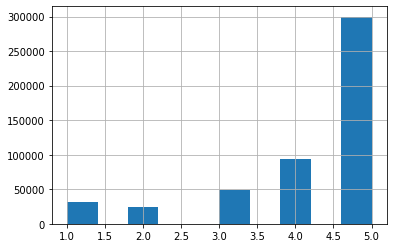

In [ ]:
#since altire is crashing with large dataset just used histogram in pandas to check the distribution
data['overall'].hist()

The Data is heavily biased with posive reviews.we can visualize this using Altair too

In [ ]:
#disabling max rows setting (which is 5000) altire can plot
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

In [ ]:
#alternative way to disable max_rows feature
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [ ]:
#plotting distribution using altire crashed when rows exceeded 5000
alt.Chart(data[:5000]).mark_bar().encode(x= 'overall', y = 'count()')

alt.Chart(...)

In [ ]:
alt.Chart(data[:5000]).mark_bar().encode(x= 'overall', y = 'count()')

In [ ]:
#random under sampler object for undersampling the data.(no of sample for each category is given in sampling startegy)
rus = RandomUnderSampler(sampling_strategy = {1 : 1500, 2 : 500, 3 : 500, 4 : 500, 5 : 1500}, random_state = 42)

In [ ]:
#undersapmle the data with above strategy
data_rus,_ = rus.fit_sample(data, data['overall'])

In [ ]:
type(data_rus)

tuple

In [ ]:
#convert undersampled data into dataframe
small_rus = pd.DataFrame(data_rus)

In [ ]:
small_rus.head()

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image
0,1.0,False,"10 22, 2008",A74TA8X5YQ7NE,B000X9FV5M,NeuroSplicer,Recently UBISOFT had to settle a huge class-ac...,THE DAY GAMING CRIED...,1224633600,NaN,{'Format:': ' Video Game'},NaN
1,1.0,True,"03 17, 2018",A2EYD6E0TFQPVL,B014G03F24,chris,"code didn't work, got me a refund.",One Star,1521244800,NaN,NaN,NaN
2,1.0,True,"02 22, 2017",A303LKXI2SAZQ4,B003OAE79S,tammy,"these do not work at all, all i get is static ...","these do not work at all, all i get ...",1487721600,NaN,{'Size:': ' one size'},NaN
3,1.0,False,"03 23, 2012",A1JGSUX59ZTWYE,B004UDLRMS,Bear,well let me start by saying that when i first ...,last gen game,1332460800,6,{'Format:': ' Video Game'},NaN
4,1.0,False,"05 16, 2008",AXIVHIP86D1MJ,B0013B30SY,Mustang,"Dont waste your money, you will just end up us...",Waste,1210896000,4,NaN,NaN


By above code we under sampled the data with following condition : random sample of the reviews by selecting 1500 reviews with rating 1, 500-500-500 reviews with ratings 2, 3, 4, and 1500 reviews with rating 5

In [ ]:
#undersampled data have 4500 samples with 12 features
small_rus.shape

(4500, 12)

In [ ]:
#disribution of new small corpus
alt.Chart(small_rus).mark_bar().encode(x= 'overall', y = 'count()')

alt.Chart(...)

Above we created a small corpus with 4500 samples and stored in a dataframe named small_rus.Now we are going to create a much large dataset with 100000 samples and store in a dataframe.

In [ ]:
#use numpy random integer generator to produce random 100000 numbers between 0 to total no:of orginal samples
np.random.seed(42)
random_indices = randint(0, data.shape[1], size = 100000)

In [ ]:
%%time
#creating a dataframe with 100000 samples taken from original dataset in a random manner
large_corpus = pd.DataFrame([])
for i in random_indices:
  large_corpus = large_corpus.append(data.iloc[i])

CPU times: user 32min 14s, sys: 29.4 s, total: 32min 44s
Wall time: 32min 47s


In [ ]:
large_corpus.head()

,asin,image,overall,reviewText,reviewTime,reviewerID,reviewerName,style,summary,unixReviewTime,verified,vote
6,0700026657,NaN,1.0,"I'm an avid gamer, but Anno 2070 is an INSULT ...","08 2, 2014",A1KXJ1ELZIU05C,Creation27,NaN,Avoid This Game - Filled with Bugs,1.406938e+09,0.0,NaN
3,0700026657,NaN,2.0,"found the game a bit too complicated, not what...","02 20, 2015",A2204E1TH211HT,Grandma KR,NaN,Two Stars,1.424390e+09,1.0,NaN
10,0700026657,NaN,4.0,4 Stars because they like it and play it often...,"12 28, 2012",A2M8JTIST6FPZZ,Amazon Customer,NaN,My boys enjoys these strategy games,1.356653e+09,1.0,NaN
7,0700026657,NaN,5.0,I bought this game thinking it would be pretty...,"03 3, 2014",A1WK5I4874S3O2,WhiteSkull,NaN,A very good game balance of skill with depth o...,1.393805e+09,1.0,NaN
4,0700026657,NaN,5.0,"great game, I love it and have played it since...","12 25, 2014",A2RF5B5H74JLPE,jon,NaN,love this game,1.419466e+09,1.0,NaN


In [ ]:
large_corpus.shape

(100000, 12)

In [ ]:
#distribution of new large corpus
alt.Chart(large_corpus).mark_bar().encode(x= 'overall', y = 'count()')

Crashed Altire

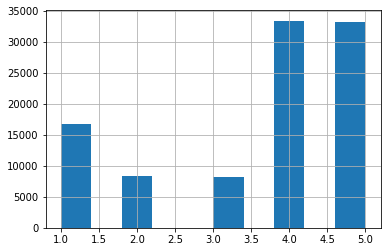

In [ ]:
##distribution of new large corpus
large_corpus['overall'].hist()

created a dataframe with 100000 samples and 12 features.This is our large dataset

We Need only he review text and ratings. so we just take these values to a new dataframe and store into two seperate csv files named small_corpus and big_corpus

In [ ]:
small_dataset = pd.DataFrame({'reviews' : small_rus['reviewText'], 'ratings' : small_rus['overall']})

In [ ]:
small_dataset.head()

,reviews,ratings
0,Recently UBISOFT had to settle a huge class-ac...,1.0
1,"code didn't work, got me a refund.",1.0
2,"these do not work at all, all i get is static ...",1.0
3,well let me start by saying that when i first ...,1.0
4,"Dont waste your money, you will just end up us...",1.0


In [ ]:
large_dataset = pd.DataFrame({'reviews' : large_corpus['reviewText'], 'ratings' : large_corpus['overall']})

In [ ]:
large_dataset.reset_index(drop=True)

,reviews,ratings
0,"I'm an avid gamer, but Anno 2070 is an INSULT ...",1.0
1,"found the game a bit too complicated, not what...",2.0
2,4 Stars because they like it and play it often...,4.0
3,I bought this game thinking it would be pretty...,5.0
4,"great game, I love it and have played it since...",5.0
...,...,...
99995,I have played the old anno 1701 AND 1503. thi...,5.0
99996,I played it a while but it was alright. The st...,4.0
99997,"great game, I love it and have played it since...",5.0
99998,"This game is a bit hard to get the hang of, bu...",5.0


In [ ]:
#saving to csv files
small_dataset.to_csv('/content/drive/My Drive/Manning_NLP_Project/data/small_corpus.csv')
large_dataset.to_csv('/content/drive/My Drive/Manning_NLP_Project/data/big_corpus.csv')

First part of our project has been finished